In [1]:
# import library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

import matplotlib
matplotlib.rcParams['axes.unicode_minus'] = False

from matplotlib import font_manager, rc
font_name = font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
rc('font', family=font_name)

In [2]:
# load data
ks11 = pd.read_csv('^ks11.csv') # feature selection

# preprocess data
ks11 = ks11.dropna()
del ks11['Volume']
ks11.index = ks11.Date.map(lambda x : pd.Timestamp(x))
del ks11['Date']

ks12 = ks11.copy() # correlation

In [3]:
# define feature
def add_feature(df):
    df["pct_change"] = df.Close.pct_change()
    for i in range(1, 91, 3):
        df["close_ma_{}".format(i)] = df.Close.rolling(window = i).mean()
    for i in [7, 21, 30, 60, 90, 91, 100, 120]:
        df["his_vol_{}".format(i)] = df["pct_change"].rolling(window = i).std()*(252**0.5)
    for i in range(1, 91, 3):
        df['returnsCC{}'.format(i) ]= np.log(df.Open / df.Close.shift(i))
        df['returnsOO{}'.format(i) ] = np.log(df.Open / df.Open.shift(i))
        df['returnsCC{}'.format(i) ]= np.log(df.Close / df.Close.shift(i))
        df['returnsOC{}'.format(i) ] = np.log(df.Close / df.Open.shift(i))
    return df
def add_target(df):
    for i in range(1, 92, 3):
        for shift in range(1, 92, 3):
            df['sh{:03}_Y2_{:03}'.format(shift, i)] = df.Close.shift(-1*shift).rolling(i).mean() - df.Close.rolling(i).mean()
    return df

# define feature2
def get_MACD(df, short_ma=12, long_ma=26, signal_period=9):
    ewm_12 = df['Close'].ewm(span = short_ma, min_periods = short_ma - 1).mean()
    ewm_26 = df['Close'].ewm(span = long_ma, min_periods = long_ma - 1).mean()
    df['MACD'] = ewm_12 - ewm_26
    df['MACDSignal'] = df['MACD'].ewm(span = signal_period, min_periods = signal_period-1).mean()
    df['MACDDiff'] = df['MACD'] - df['MACDSignal']
    return df

def get_Stochastic(df, n=14):
    df['sto_K_{}'.format(n)] = 100 * ((df.Close - df.Low.rolling(n).min()) / 
                                      (df.High.rolling(n).max() - df.Low.rolling(n).min()))
    df['sto_D_{}'.format(n)] = df['sto_K_{}'.format(n)].rolling(3).mean()
    return df
    
def get_RSI(df, n=14):
    U = np.where(df['Close'].diff(1)>0, df['Close'].diff(1), 0)
    D = np.where(df['Close'].diff(1)<0, df['Close'].diff(1)*(-1), 0)
    
    AU = pd.Series(U).rolling(window=n, min_periods=n).mean()
    AD = pd.Series(D).rolling(window=n, min_periods=n).mean()
    
    RSI = AU.div(AD+AU) * 100
    df['RSI_{}'.format(n)] = RSI.values
    return df
    
def get_BolingerBand(df, n=20, k=2):
    df = df.assign(BolingerCenter = df['Close'].rolling(window=n).mean())
    df = df.assign(Bol_upper = df['Close'].rolling(window=n).mean() + k*df['Close'].rolling(window=n).std())
    df = df.assign(Bol_lower = df['Close'].rolling(window=n).mean() - k*df['Close'].rolling(window=n).std())
    return df

def get_SMA(df, window):
    df['close_ma_{}'.format(window)] = df['Close'].rolling(window).mean()
    return df
    
def get_EMA(df, window):
    df['close_ema_{}'.format(window)] = df['Close'].ewm(span=window).mean()
    return df
    
def get_RoC(df, periods):
    df['roc_{}'.format(periods)] = df['Close'].pct_change(periods=periods)
    return df
    
def get_CV(df, window):
    df['his_vol_{}'.format(window)] = np.log(df['Close'] / df['Close'].shift(1)).rolling(window).std()*(252**0.5)
    return df
    
def get_WilliamR(df, n):
    W_R = -100 * ((df.High.rolling(n).max() - df.Close) / (df.High.rolling(n).max() - df.Low.rolling(n).min()))
    df['WR_{}'.format(n)] = W_R
    return df
    
def get_CCI(df, window):
    TP = (df.Close + df.Low + df.High) / 3
    dataX = []
    for i in range(len(TP) - window+1):
        a = TP.values[i:(i+window)]
        dataX.append(a)
    dataMean = [i.mean() for i in dataX]
    AVEDEV = [abs(x - mean).mean() for x, mean 
              in zip(dataX, dataMean)]
    for i in range(window-1):
        AVEDEV.insert(0,np.nan)
    AVEDEV = pd.Series(AVEDEV, index = TP.index)
    CCI = (TP - TP.rolling(20).mean()) / (0.015 * AVEDEV)
    df['CCI_{}'.format(window)] = CCI
    return df
    
def get_DI(df, window):
    df['DI_{}'.format(window)] = 100 * ((df.Close - df.Close.rolling(window).mean()) / df.Close.rolling(window).mean())
    return df

def get_VPT(df):
    df['VPT'] = ((test.Close.diff(1) / test.Close) * test.Volume).cumsum()
    return df
    
def get_MA_diff(df, window):
    df['ma_diff_{}'.format(window)] = df['Close'].rolling(window).mean() - df['Close'].shift(window).rolling(window).mean()
    return df

def get_MA_n_diff(df, n, window):
    df['ma_{}_diff_{}'.format(n, window)] = df['Close'].rolling(window).mean() - df['Close'].rolling(window+n).mean()
    return df
    
def get_OBV(df):
    df['OBV'] = (np.sign(df['Close'].diff(1).fillna(0)) * df['Volume']).cumsum()
    return df

In [16]:
ks11 = add_feature(ks11)
ks11 = add_target(ks11)
ks11 = ks11.dropna()
X = [col for col in ks11.columns if col.find('Y2') == -1]
y_li = [col for col in ks11.columns if col.find('Y2') != -1]
# train = ks11.loc['2013-01-01':'2018-01-01']
# test = ks11.loc['2018-01-01':]
# import xgboost as xgb

# def modelfit(train, X, y):
#     alg = XGBClassifier(
#          learning_rate =0.15,
#          n_estimators=1000,
#          max_depth=5,
#          min_child_weight=2,
#          gamma=0,
#          subsample=0.8,
#          colsample_bytree=0.8,
#          objective= 'binary:logistic',
#          nthread=4,
#          scale_pos_weight=1,
#          seed=27)
#     xgb_params = alg.get_xgb_params()
#     xgtrain = xgb.DMatrix(train[X].values, label=np.where(train[y].values>=0, 1,0))
#     cvresult=xgb.cv(xgb_params, xgtrain,
#                     num_boost_round=alg.get_params()['n_estimators'],
#                     nfold=5, early_stopping_rounds=50,
#                     show_stdv=False)
#     alg.set_params(n_estimators=cvresult.shape[0])
#     alg.fit(train[X].values, np.where(train[y].values>=0, 1,0), eval_metric='auc')
#     return alg

# from tqdm import tqdm_notebook

# res = {}
# for y in tqdm_notebook(y_li):
#     model = modelfit(train, X, y)
#     res[y] = model

# from sklearn import metrics
# p = pd.DataFrame(index = [i for i in range(1,91,3)], columns=[i for i in range(1,91,3)])
# for y, alg in res.items():
#     shift = int(y[2:5])
#     ma = int(y[-3:])
#     acc = metrics.accuracy_score(np.where(test[y].values>=0, 1,0), alg.predict(test[X].values))
#     p.loc[ma, shift] = acc

import pickle
with open('original_20190119.pickle', 'rb') as handle:
    p, res1 = pickle.load(handle)

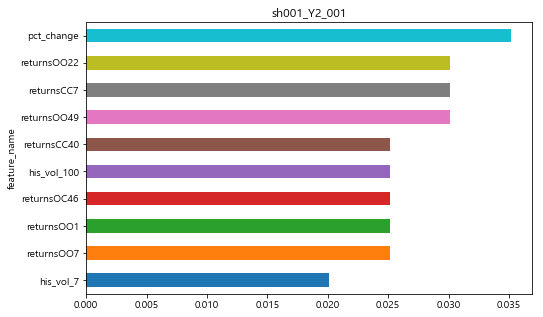

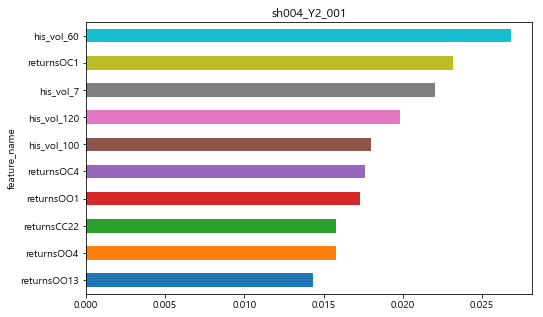

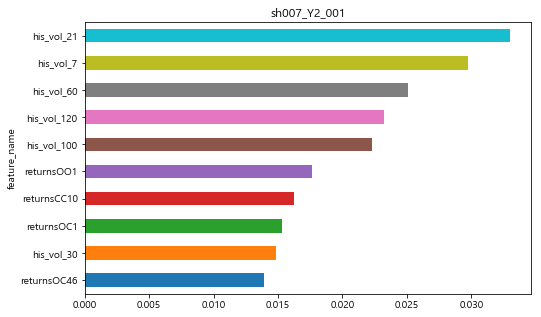

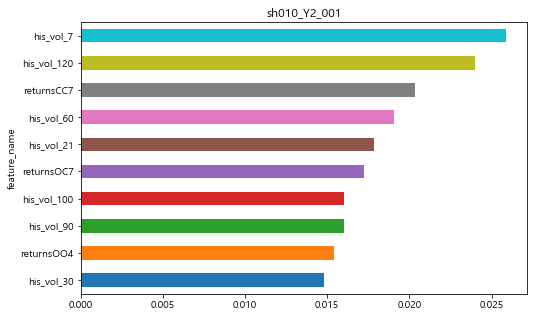

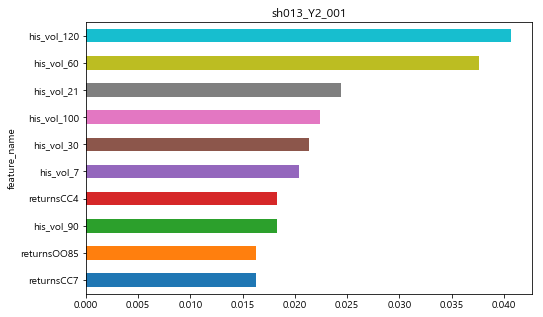

...

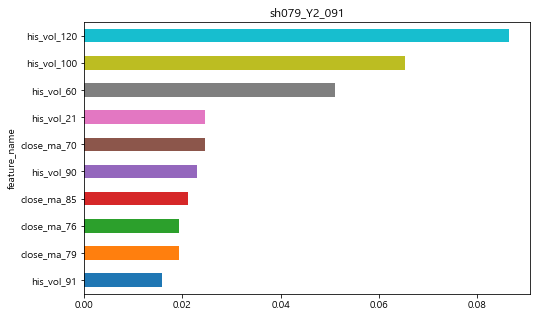

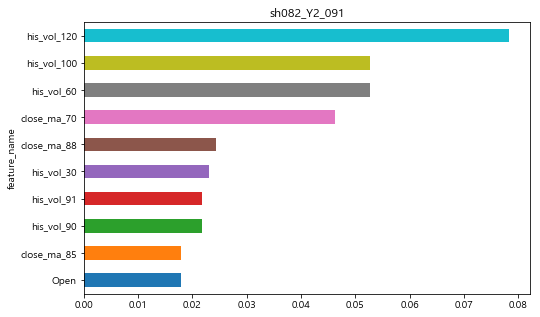

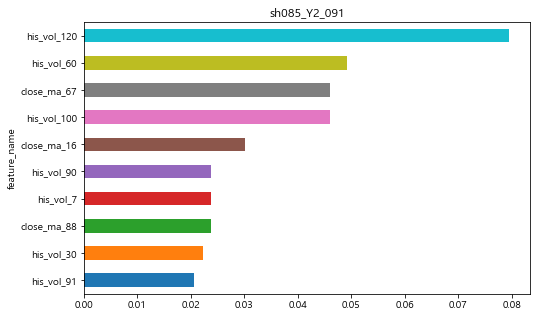

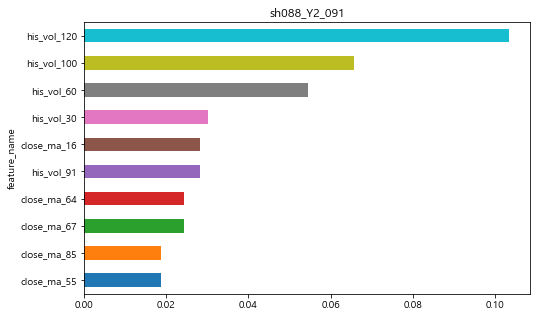

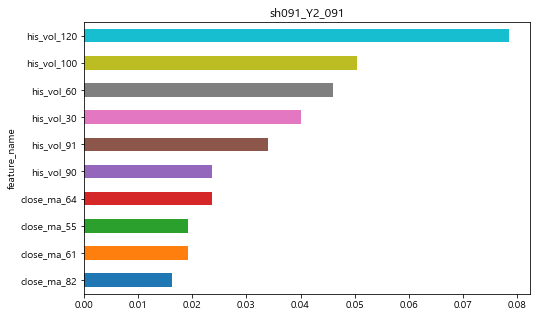

In [48]:
y = 'sh001_Y2_001'
for y in y_li:
    feature_imp = pd.concat((pd.Series(X), pd.Series(res1[y].feature_importances_)), axis=1)
    feature_imp.columns = ["feature_name", "feature_importance"]
    feature_imp.sort_values('feature_importance')[-10:].plot(y='feature_importance', x='feature_name', kind='barh', legend=False, figsize=(8,5))
    plt.title(y, fontsize=12)
    plt.show()

array([0.        , 0.00502513, 0.0201005 , 0.00502513, 0.        ,
       0.03517588, 0.        , 0.01005025, 0.        , 0.0201005 ,
       0.00502513, 0.00502513, 0.        , 0.0201005 , 0.01005025,
       0.00502513, 0.00502513, 0.        , 0.        , 0.00502513,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00502513, 0.        , 0.        , 0.00502513, 0.00502513,
       0.        , 0.00502513, 0.        , 0.        , 0.        ,
       0.        , 0.0201005 , 0.01005025, 0.01005025, 0.01005025,
       0.        , 0.01507538, 0.02512563, 0.01507538, 0.00502513,
       0.02512563, 0.01005025, 0.00502513, 0.01507538, 0.01005025,
       0.03015075, 0.02512563, 0.00502513, 0.00502513, 0.0201005 ,
       0.        , 0.01005025, 0.00502513, 0.        , 0.01005025,
       0.        , 0.        , 0.        , 0.00502513, 0.00502513,
       0.01005025, 0.03015075, 0.00502513, 0.        , 0.01005025,
       0.0201005 , 0.01005025, 0.        , 0.00502513, 0.02010